In [1]:
import sys
import os
import uproot
import numpy  as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy import stats as st
import scipy

import peakutils

from datetime import datetime

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
### Import functions from peak_functions

repository_path = os.path.abspath('..')
sys.path.append(repository_path)

import blr_functions  as blr
import peak_functions as pf
import fit_functions  as fitf

In [4]:
plt.rcParams["figure.figsize"] = 9, 6
plt.rcParams["font.size"]      = 12

In [5]:
filename = '/Users/romoluque_c/LEGEND/BACON/datatest/run-06_02_2023-file.root'
infile   = uproot.open(filename)
RawTree  = infile['RawTree']

In [6]:
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']

0
1
2
4
5
6
7
8
9
10
11


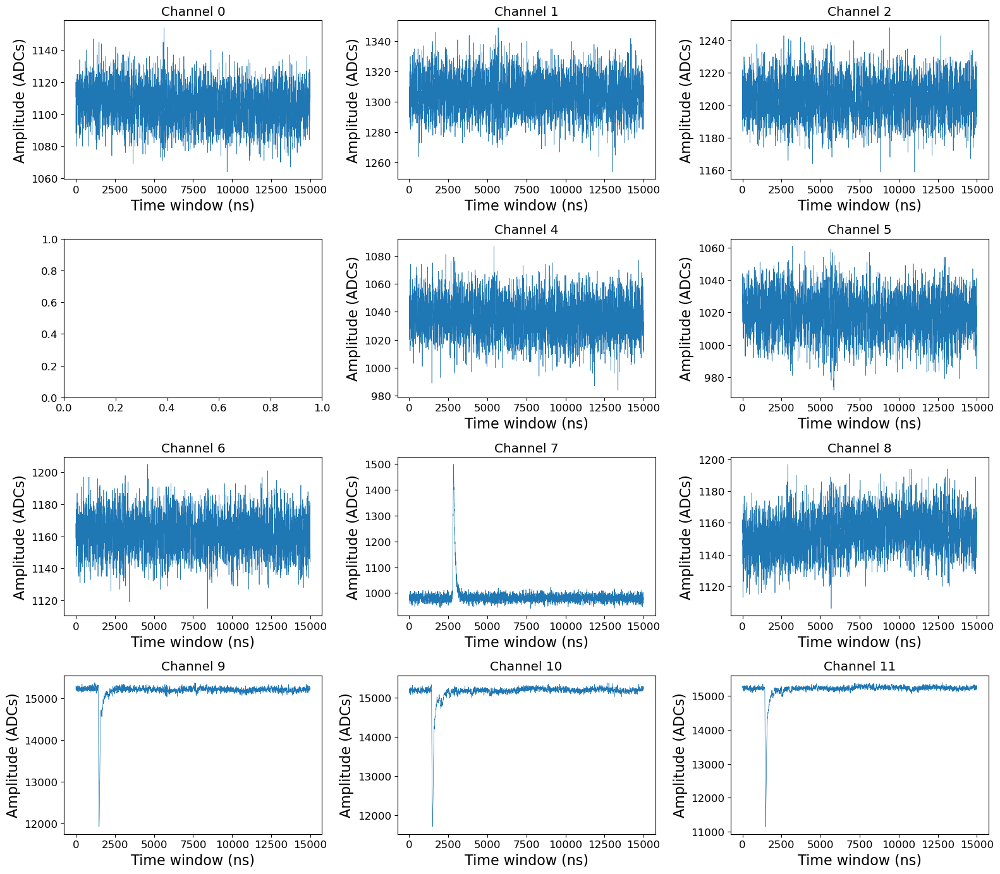

In [7]:
fig, axs = plt.subplots(4, 3, figsize=(16, 14))
for k in range(12):
    if k==3: continue
    i = int(k/3)
    j = k%3
    print(k)
    sum_wf = np.sum(np.array(RawTree[f'chan{k}/rdigi'].array())[:1], axis=0)
    axs[i][j].plot(2*np.arange(len(sum_wf)), sum_wf, linewidth=0.5)
    axs[i][j].set_xlabel('Time window (ns)', fontsize=16)
    axs[i][j].set_ylabel('Amplitude (ADCs)', fontsize=16)
    axs[i][j].set_title(f"Channel {k}")
plt.tight_layout()
plt.show()

In [8]:
subt_raw_wfs0 = pf.subtract_baseline(np.array(RawTree[f'chan0/rdigi'].array()), mode=False, wf_range_bsl=(0,650))
subt_raw_wfs1 = pf.subtract_baseline(np.array(RawTree[f'chan1/rdigi'].array()), mode=False, wf_range_bsl=(0,650))
subt_raw_wfs2 = pf.subtract_baseline(np.array(RawTree[f'chan2/rdigi'].array()), mode=False, wf_range_bsl=(0,650))
subt_raw_wfs4 = pf.subtract_baseline(np.array(RawTree[f'chan4/rdigi'].array()), mode=False, wf_range_bsl=(0,650))
subt_raw_wfs5 = pf.subtract_baseline(np.array(RawTree[f'chan5/rdigi'].array()), mode=False, wf_range_bsl=(0,650))
subt_raw_wfs6 = pf.subtract_baseline(np.array(RawTree[f'chan6/rdigi'].array()), mode=False, wf_range_bsl=(0,650))
subt_raw_wfs7 = pf.subtract_baseline(np.array(RawTree[f'chan7/rdigi'].array()), mode=False, wf_range_bsl=(0,650))
subt_raw_wfs8 = pf.subtract_baseline(np.array(RawTree[f'chan8/rdigi'].array()), mode=False, wf_range_bsl=(0,650))

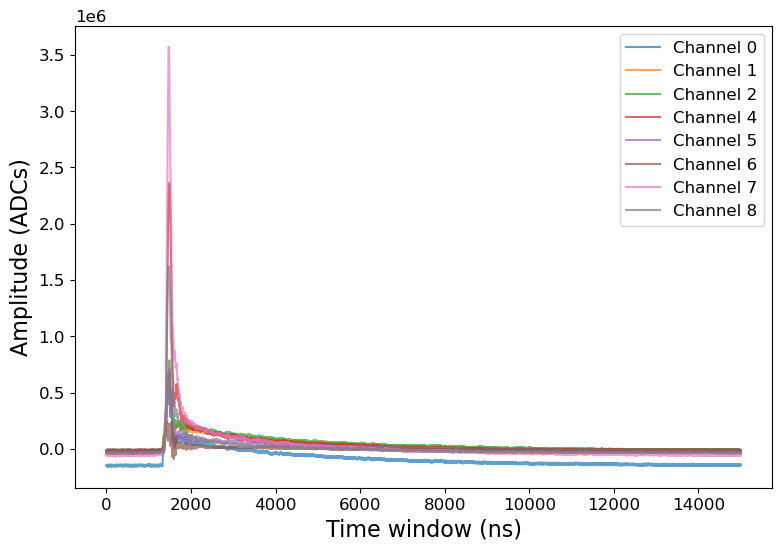

In [9]:
sum_wf0 = np.sum(subt_raw_wfs0, axis=0)
sum_wf1 = np.sum(subt_raw_wfs1, axis=0)
sum_wf2 = np.sum(subt_raw_wfs2, axis=0)
sum_wf4 = np.sum(subt_raw_wfs4, axis=0)
sum_wf5 = np.sum(subt_raw_wfs5, axis=0)
sum_wf6 = np.sum(subt_raw_wfs6, axis=0)
sum_wf7 = np.sum(subt_raw_wfs7, axis=0)
sum_wf8 = np.sum(subt_raw_wfs8, axis=0)
plt.plot(2*np.arange(len(sum_wf0)), sum_wf0, label='Channel 0', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf1)), sum_wf1, label='Channel 1', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf2)), sum_wf2, label='Channel 2', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf4)), sum_wf4, label='Channel 4', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf5)), sum_wf5, label='Channel 5', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf6)), sum_wf6, label='Channel 6', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf7)), sum_wf7, label='Channel 7', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf8)), sum_wf8, label='Channel 8', alpha=0.7)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADCs)', fontsize=16)
plt.legend()
#plt.yscale('log')
plt.show()

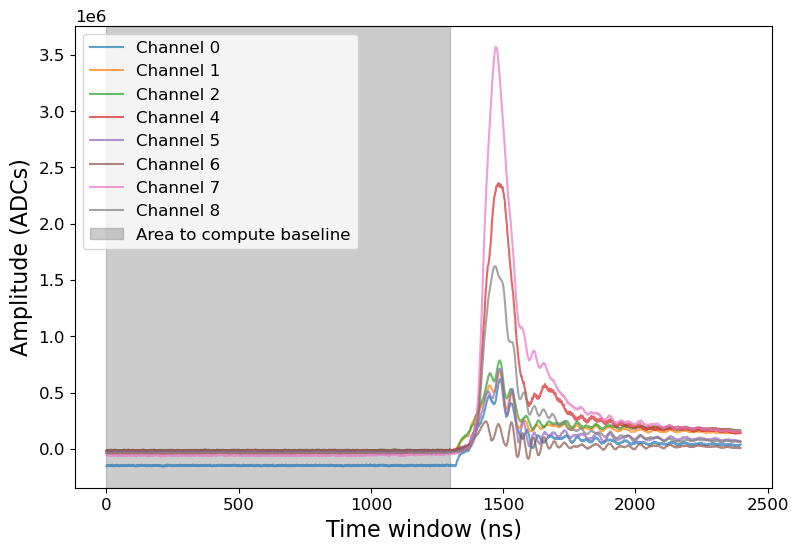

In [10]:
plt.plot(2*np.arange(len(sum_wf0))[:1200], sum_wf0[:1200], label='Channel 0', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf1))[:1200], sum_wf1[:1200], label='Channel 1', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf2))[:1200], sum_wf2[:1200], label='Channel 2', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf4))[:1200], sum_wf4[:1200], label='Channel 4', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf5))[:1200], sum_wf5[:1200], label='Channel 5', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf6))[:1200], sum_wf6[:1200], label='Channel 6', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf7))[:1200], sum_wf7[:1200], label='Channel 7', alpha=0.7)
plt.plot(2*np.arange(len(sum_wf8))[:1200], sum_wf8[:1200], label='Channel 8', alpha=0.7)
plt.axvspan(0, 1300, alpha=0.4, color='grey', label='Area to compute baseline')
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADCs)', fontsize=16)
plt.legend()
#plt.yscale('log')
plt.show()

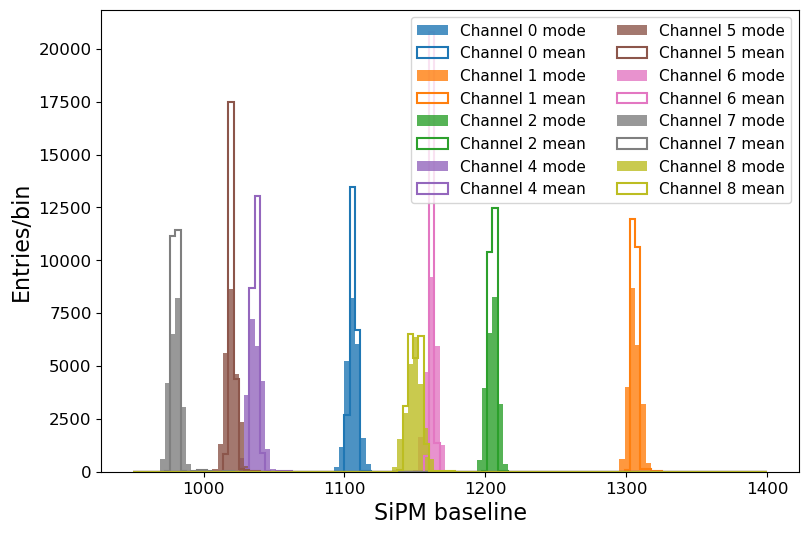

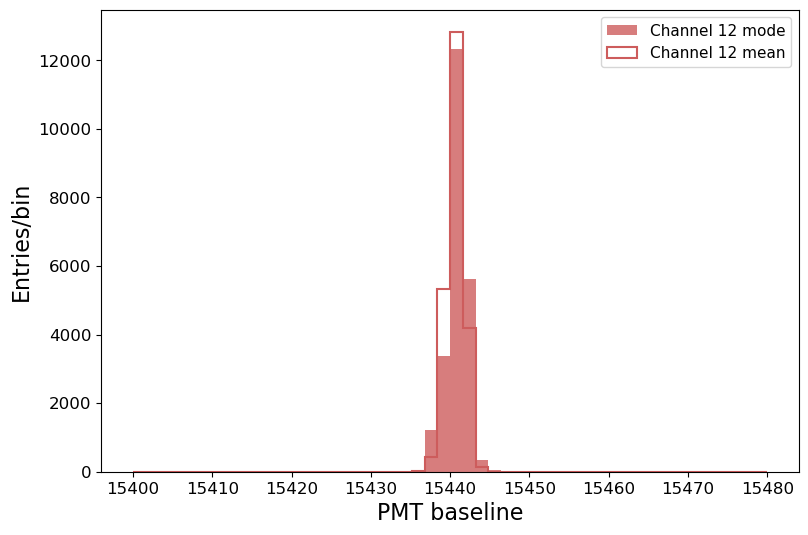

In [11]:
mean_baselines_mode = []
mean_baselines_mean = []

max_smpl_bsl = 650

for channel, col in zip(range(9), colors):
    if channel==3: continue
    all_raw_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
    #bsl_raw_wfs = list(map(pf.compute_baseline, all_raw_wfs, wf_range=(0, 700)))
    bsl_raw_wfs_mode = [pf.compute_baseline(wf, mode=True,  wf_range_bsl=(0, max_smpl_bsl)) for wf in all_raw_wfs]
    bsl_raw_wfs_mean = [pf.compute_baseline(wf, mode=False, wf_range_bsl=(0, max_smpl_bsl)) for wf in all_raw_wfs]
    mean_baselines_mode.append(np.mean(bsl_raw_wfs_mode))
    mean_baselines_mean.append(np.mean(bsl_raw_wfs_mean))
    plt.hist(bsl_raw_wfs_mode, bins=120, range=(950, 1400), label=f'Channel {channel} mode', color=col, alpha=0.8)
    plt.hist(bsl_raw_wfs_mean, bins=120, range=(950, 1400), label=f'Channel {channel} mean', color=col, histtype='step', linewidth=1.5)
plt.xlabel('SiPM baseline', fontsize=16)
plt.ylabel('Entries/bin',   fontsize=16)
plt.legend(ncol=2, fontsize=11)
plt.show()

channel     = 12
all_raw_wfs = np.array(RawTree[f'chan{channel}/rdigi'].array())
bsl_raw_wfs_mode = [pf.compute_baseline(wf[:max_smpl_bsl], mode=True)  for wf in all_raw_wfs]
bsl_raw_wfs_mean = [pf.compute_baseline(wf[:max_smpl_bsl], mode=False) for wf in all_raw_wfs]
mean_baselines_mode.append(np.mean(bsl_raw_wfs_mode))
mean_baselines_mean.append(np.mean(bsl_raw_wfs_mean))
plt.hist(bsl_raw_wfs_mode, bins=50, range=(15400, 15480), label=f'Channel {channel} mode', color='indianred', alpha=0.8)
plt.hist(bsl_raw_wfs_mean, bins=50, range=(15400, 15480), label=f'Channel {channel} mean', color='indianred', histtype='step', linewidth=1.5)
plt.xlabel('PMT baseline', fontsize=16)
plt.ylabel('Entries/bin',  fontsize=16)
plt.legend(fontsize=11)
plt.show()

mean_baselines_mode = np.array(mean_baselines_mode)
mean_baselines_mean = np.array(mean_baselines_mean)

In [14]:
len(all_raw_wfs[0].shape)

1

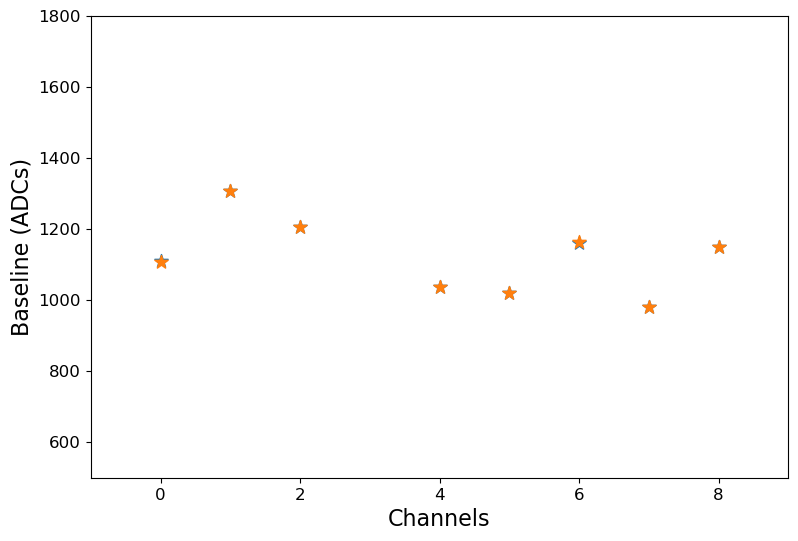

In [38]:
plt.scatter([0, 1, 2, 4, 5, 6, 7, 8], mean_baselines_mode[:-1], marker='*', s=100)
plt.scatter([0, 1, 2, 4, 5, 6, 7, 8], mean_baselines_mean[:-1], marker='*', s=100)
plt.xlim(-1, 9)
plt.ylim(500, 1800)
plt.xlabel('Channels'       , fontsize=16)
plt.ylabel('Baseline (ADCs)', fontsize=16)
plt.show()

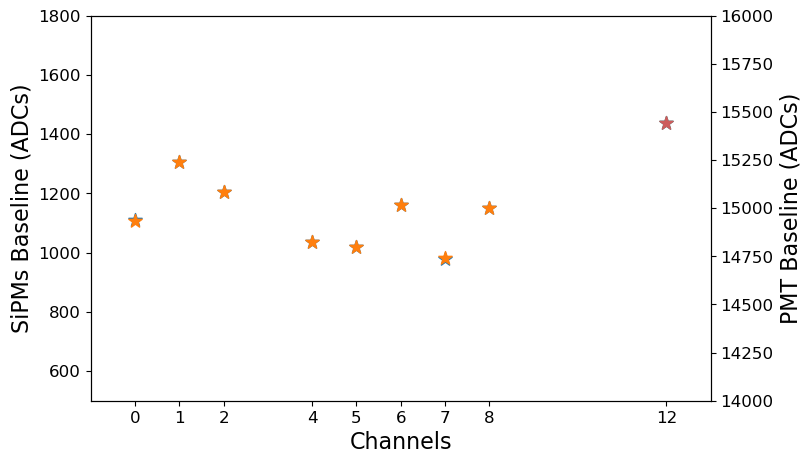

In [39]:
fig, ax0 = plt.subplots(1, 1, figsize=(8,5))
ax0.scatter([0, 1, 2, 4, 5, 6, 7, 8], mean_baselines_mode[:-1], marker='*', s=100)
ax0.scatter([0, 1, 2, 4, 5, 6, 7, 8], mean_baselines_mean[:-1], marker='*', s=100)
ax1 = ax0.twinx()
ax1.scatter([12], mean_baselines_mode[-1:], marker='*', s=100, color='teal')
ax1.scatter([12], mean_baselines_mean[-1:], marker='*', s=100, color='indianred')
ax0.set_xlabel('Channels'       ,       fontsize=16)
ax0.set_ylabel('SiPMs Baseline (ADCs)', fontsize=16)
ax1.set_ylabel('PMT Baseline (ADCs)',   fontsize=16)
ax0.set_xlim(-1, 13)
ax0.set_ylim(500, 1800)
ax1.set_ylim(14000, 16000)
ax0.set_xticks([0, 1, 2, 4, 5, 6, 7, 8, 12])
plt.show()

## Study carefully PMT baseline

In [9]:
import functools

channel = 12

all_raw_wfs_pmt = np.array(RawTree[f'chan{channel}/rdigi'].array())
bsl_mode_pmt    = np.array(list(map(pf.compute_baseline, all_raw_wfs_pmt)))

compute_bsl_mean = functools.partial(pf.compute_baseline, mode=False)
bsl_mean_pmt     = np.array(list(map(compute_bsl_mean, all_raw_wfs_pmt)))

subt_raw_wfs_mean_pmt = np.array(list(map(blr.pmt_deconvolver, all_raw_wfs_pmt)))
subt_deconv_bsl_mode  = functools.partial(blr.pmt_deconvolver, mode=True)
subt_raw_wfs_mode_pmt = np.array(list(map(subt_deconv_bsl_mode, all_raw_wfs_pmt)))

## subt_raw_wfs_mode_pmt = np.array(list(map(pf.subtract_baseline, all_raw_wfs_pmt)))
## subt_bsl_mean         = functools.partial(pf.subtract_baseline, mode=False)
## subt_raw_wfs_mean_pmt = np.array(list(map(subt_bsl_mean, all_raw_wfs_pmt)))

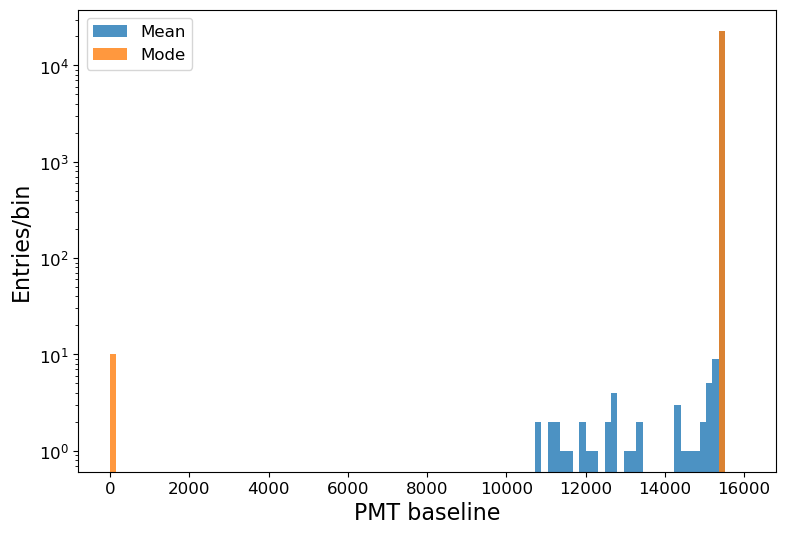

In [10]:
plt.hist(bsl_mean_pmt, range=(0, 16000), bins=100, label=f'Mean', alpha=0.8, log=True)
plt.hist(bsl_mode_pmt, range=(0, 16000), bins=100, label=f'Mode', alpha=0.8, log=True)
plt.xlabel('PMT baseline', fontsize=16)
plt.ylabel('Entries/bin',  fontsize=16)
plt.legend()
plt.show()

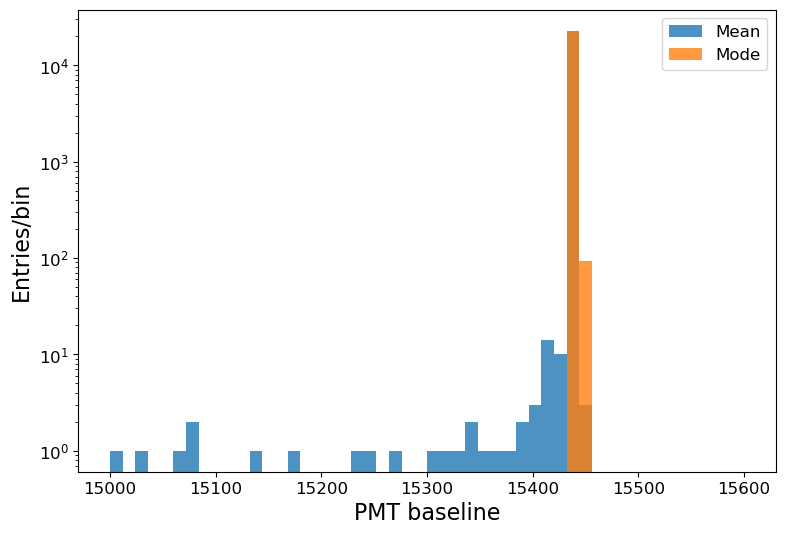

In [11]:
plt.hist(bsl_mean_pmt, range=(15000, 15600), bins=50, label=f'Mean', alpha=0.8, log=True)
plt.hist(bsl_mode_pmt, range=(15000, 15600), bins=50, label=f'Mode', alpha=0.8, log=True)
plt.xlabel('PMT baseline', fontsize=16)
plt.ylabel('Entries/bin',  fontsize=16)
plt.legend()
plt.show()

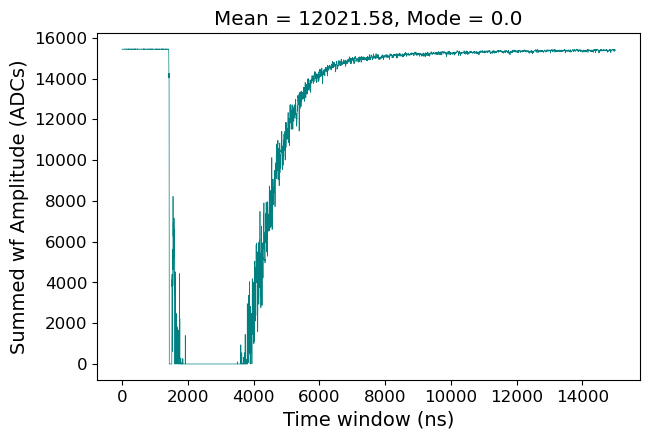

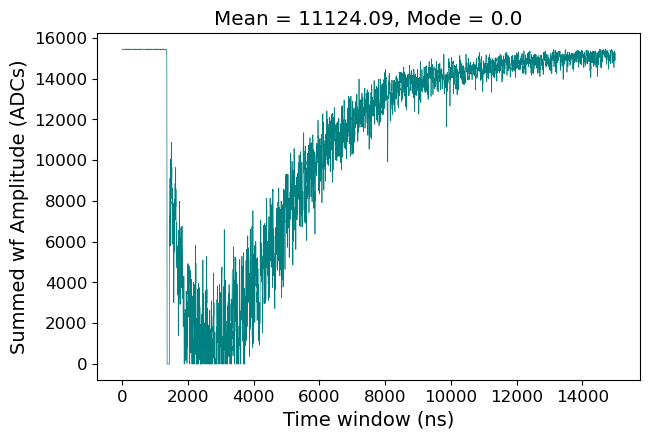

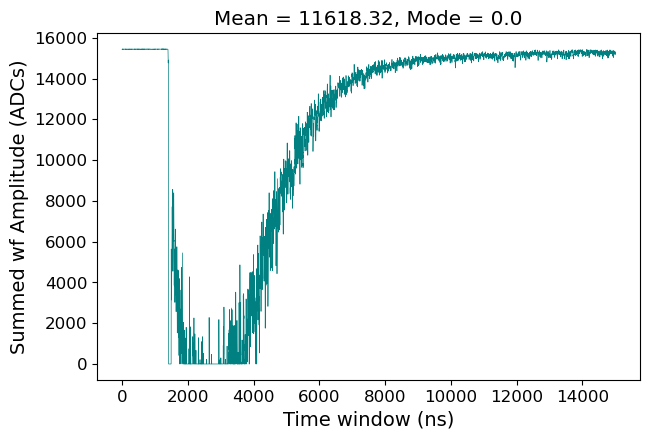

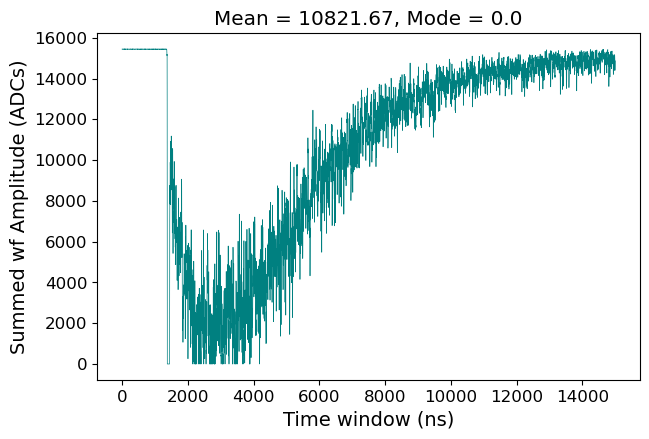

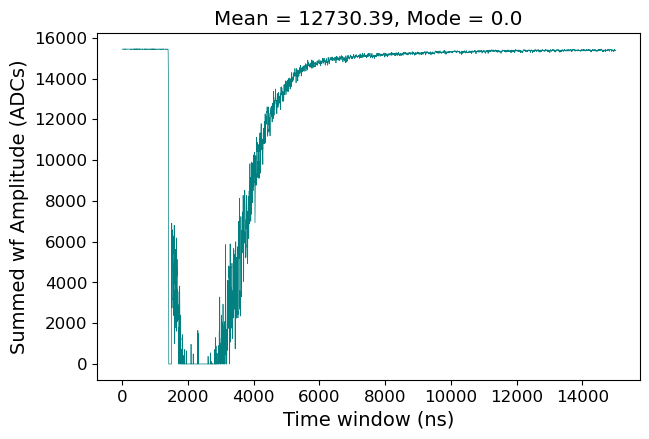

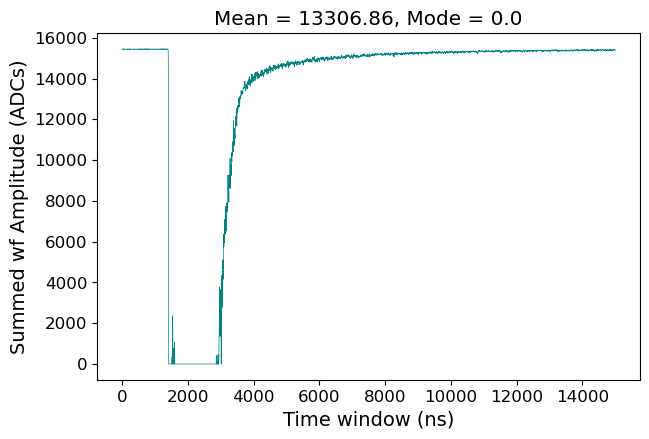

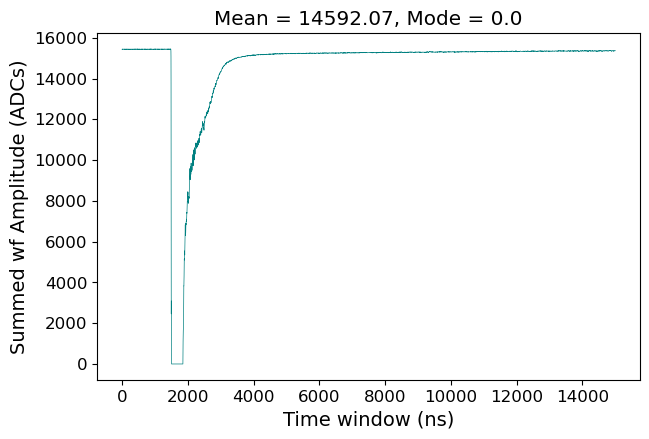

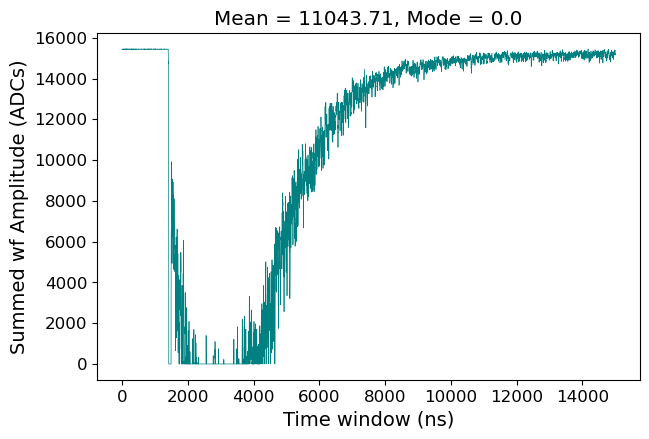

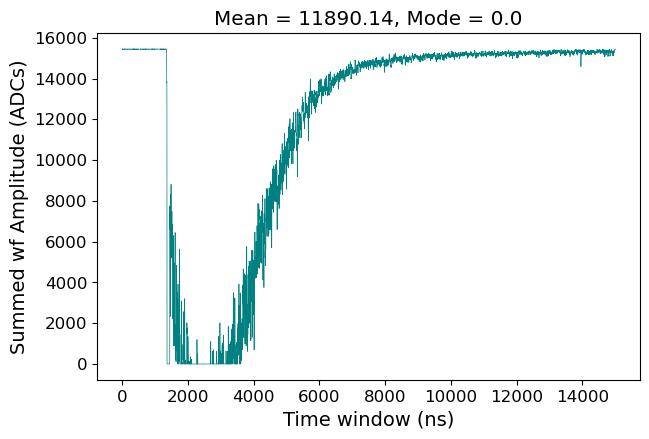

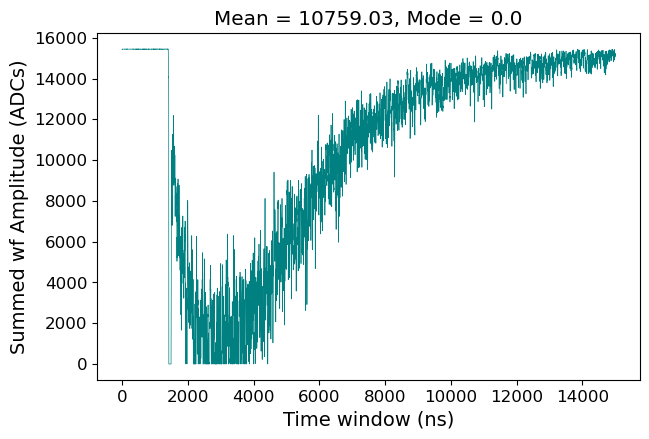

In [12]:
for iwf in np.where(np.array(bsl_mode_pmt)<2000)[0]:
    mean_bsl = np.mean(all_raw_wfs_pmt[iwf])
    mode_bsl = st.mode(all_raw_wfs_pmt[iwf], keepdims=False).mode.astype(np.float32)
    
    plt.figure(figsize=(7, 4.5))
    plt.plot(2*np.arange(len(all_raw_wfs_pmt[iwf])), all_raw_wfs_pmt[iwf], linewidth=0.5, color='teal')
    plt.title(f'Mean = {np.round(mean_bsl, 2)}, Mode = {np.round(mode_bsl, 2)}')
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Summed wf Amplitude (ADCs)', fontsize=14)
    plt.show()

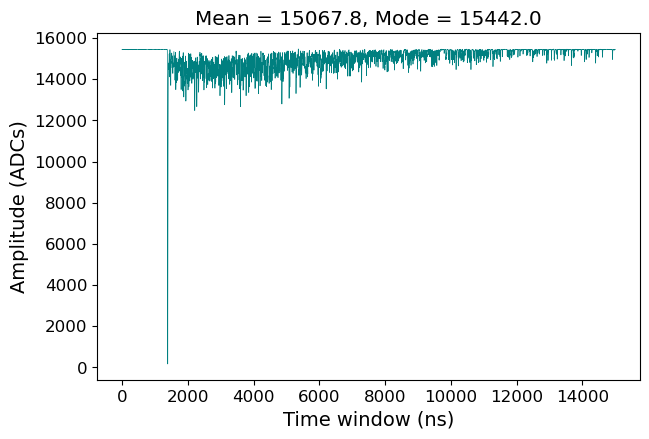

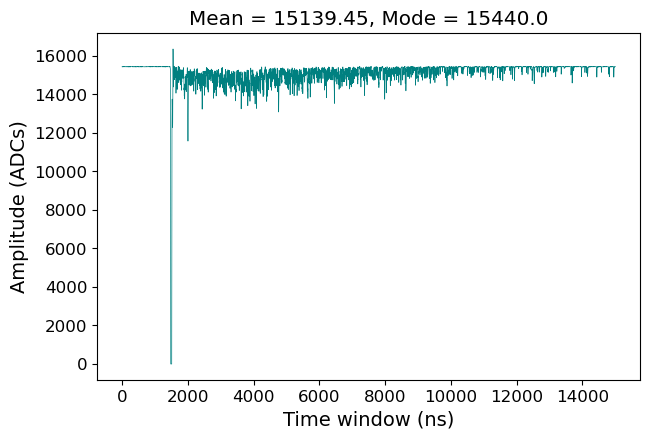

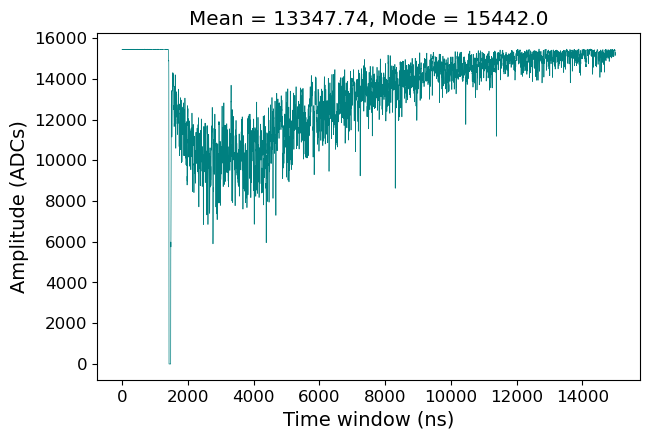

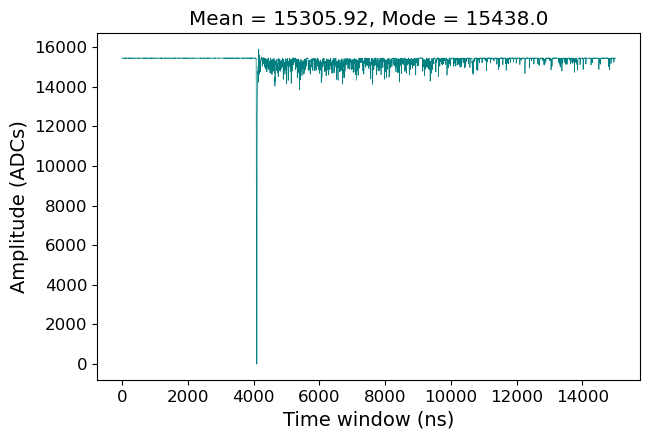

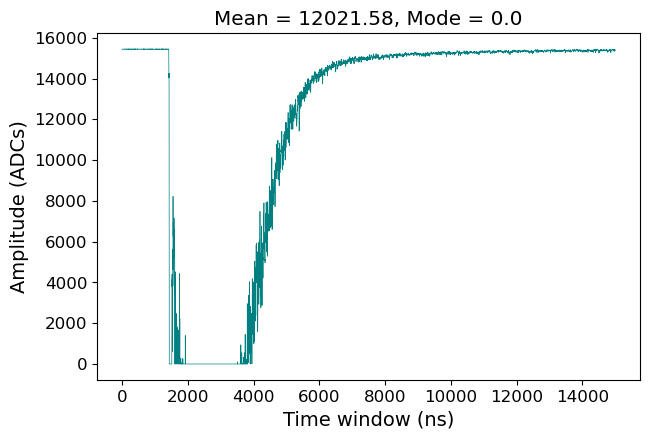

...

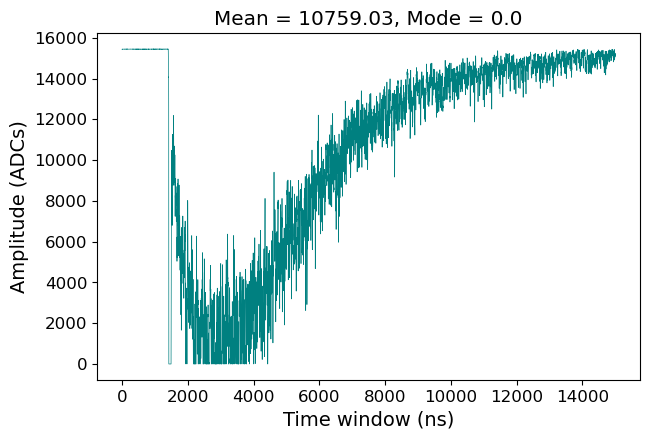

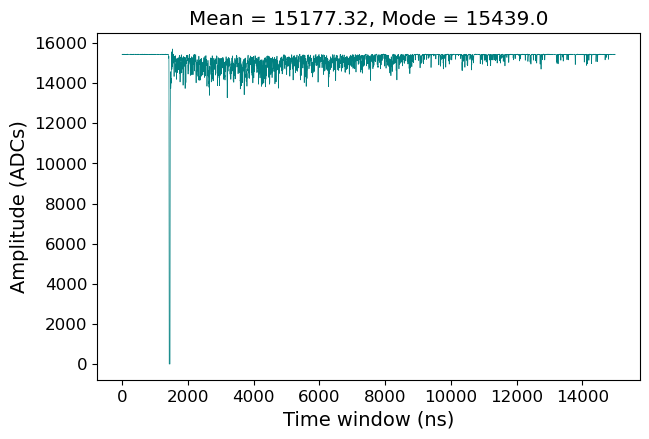

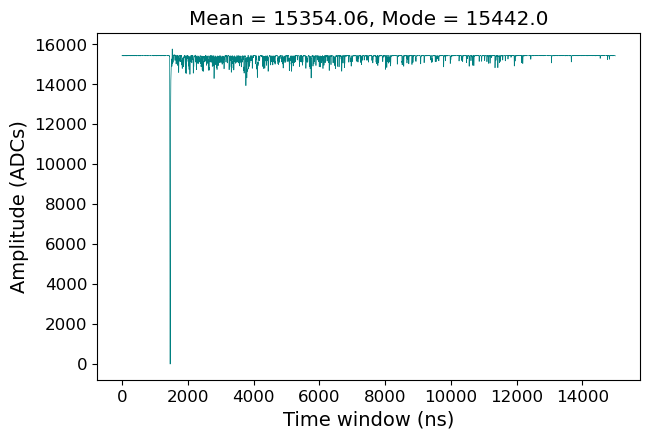

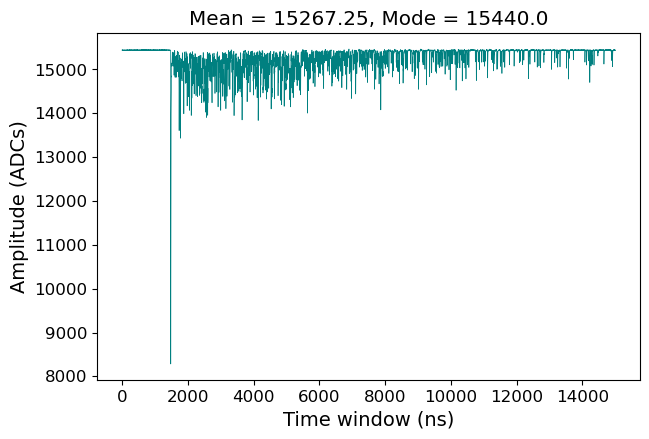

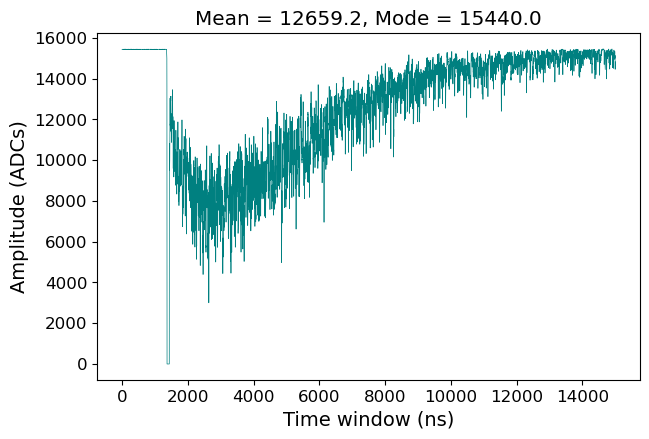

In [13]:
for iwf in np.where(np.array(bsl_mean_pmt)<15400)[0]:
    mean_bsl = np.mean(all_raw_wfs_pmt[iwf])
    mode_bsl = st.mode(all_raw_wfs_pmt[iwf], keepdims=False).mode.astype(np.float32)
    
    plt.figure(figsize=(7, 4.5))
    plt.plot(2*np.arange(len(all_raw_wfs_pmt[iwf])), all_raw_wfs_pmt[iwf], linewidth=0.5, color='teal')
    plt.title(f'Mean = {np.round(mean_bsl, 2)}, Mode = {np.round(mode_bsl, 2)}')
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Amplitude (ADCs)', fontsize=14)
    plt.show()

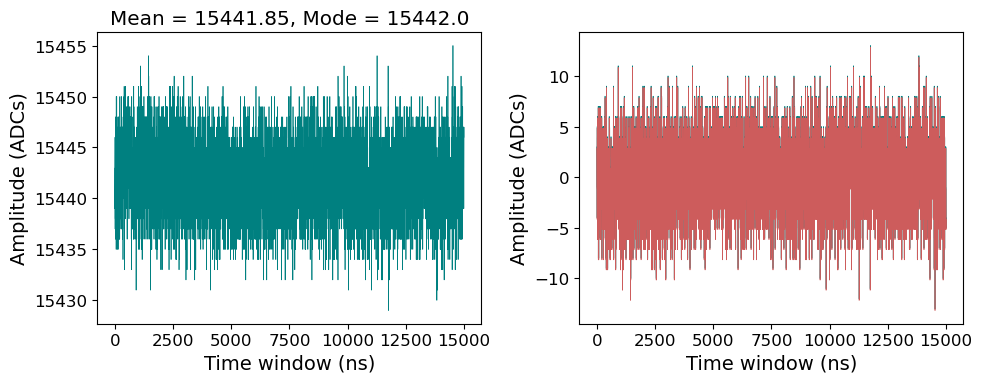

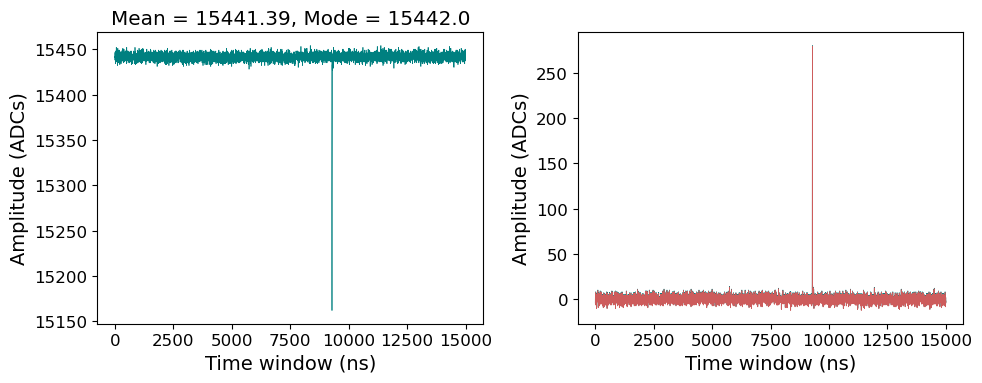

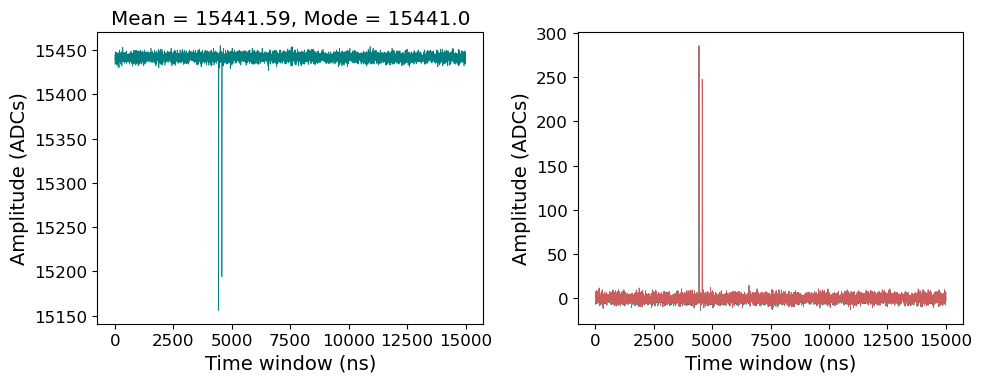

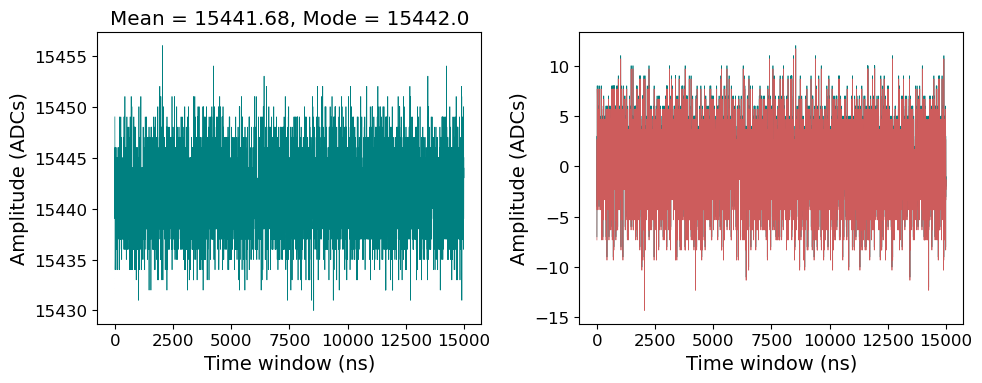

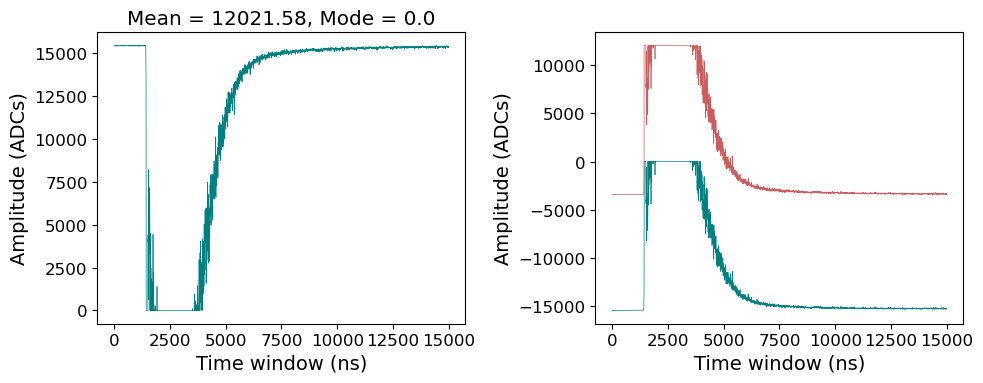

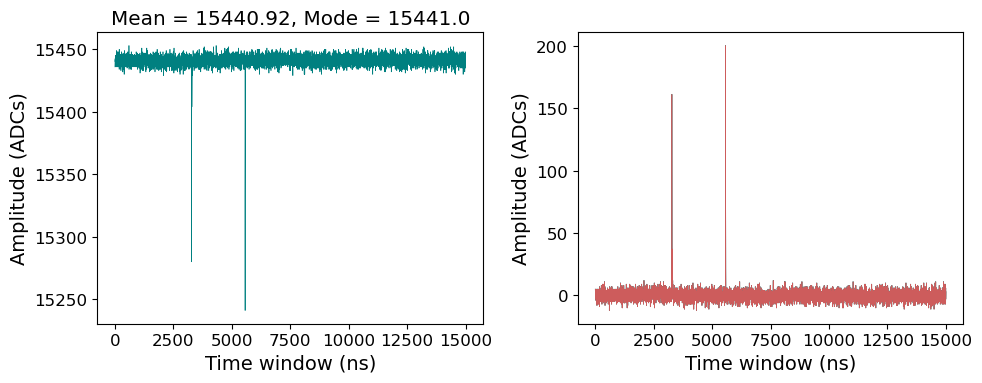

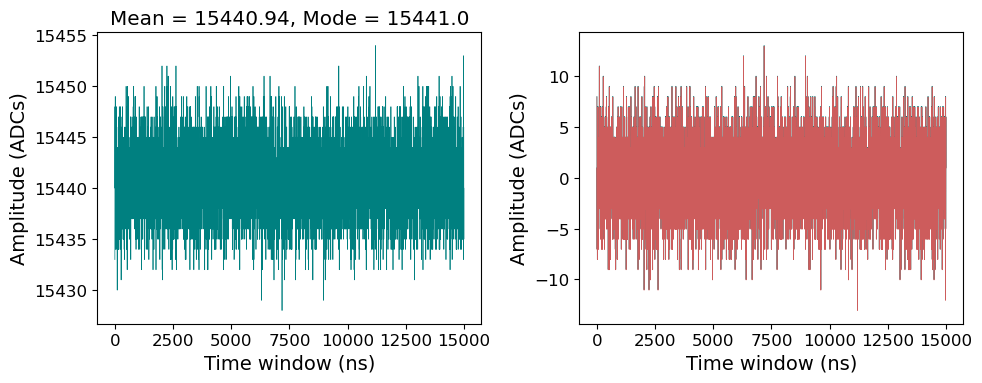

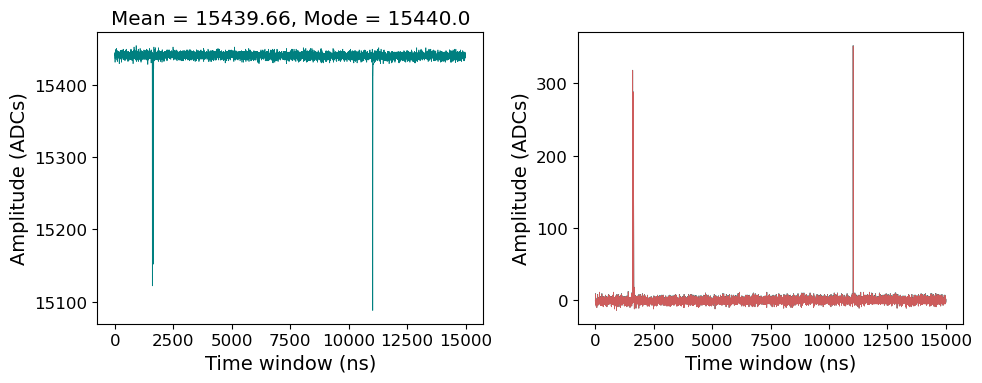

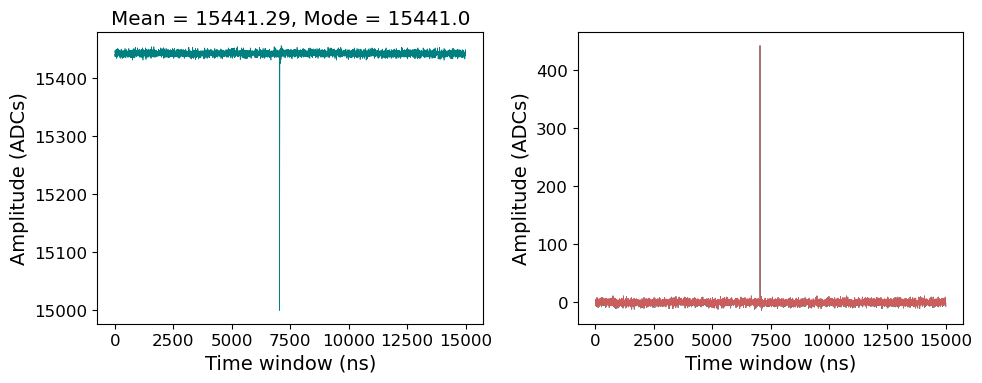

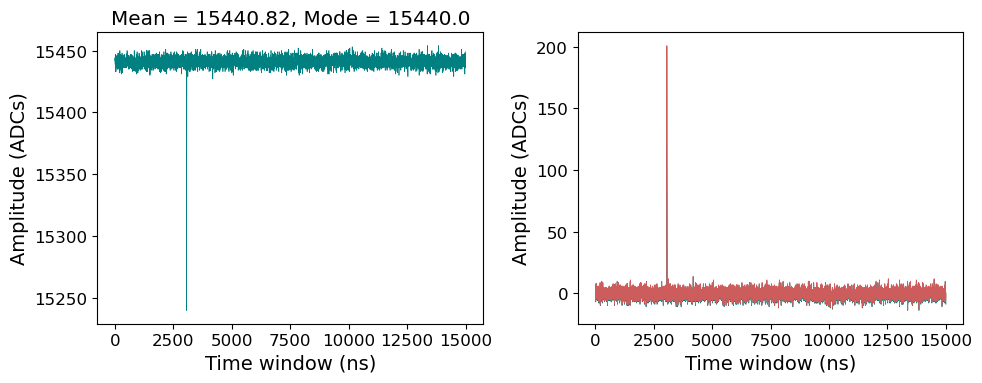

In [14]:
for iwf, (nwf, swf1, swf2) in enumerate(zip(all_raw_wfs_pmt[2160:2170], subt_raw_wfs_mode_pmt[2160:2170], subt_raw_wfs_mean_pmt[2160:2170])):    
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10,4))
    ax0.plot(2*np.arange(len(nwf )), nwf , linewidth=0.5, color='teal')
    ax1.plot(2*np.arange(len(swf1)), swf1, linewidth=0.5, color='teal'     , label='Mode')
    ax1.plot(2*np.arange(len(swf2)), swf2, linewidth=0.5, color='indianred', label='Mean')
    mean_bsl = np.mean(nwf)
    mode_bsl = st.mode(nwf, keepdims=False).mode.astype(np.float32)
    ax0.set_title(f'Mean = {np.round(mean_bsl, 2)}, Mode = {np.round(mode_bsl, 2)}')
    ax0.set_xlabel('Time window (ns)', fontsize=14)
    ax0.set_ylabel('Amplitude (ADCs)', fontsize=14)
    ax1.set_xlabel('Time window (ns)', fontsize=14)
    ax1.set_ylabel('Amplitude (ADCs)', fontsize=14)
    plt.tight_layout()
    plt.show()

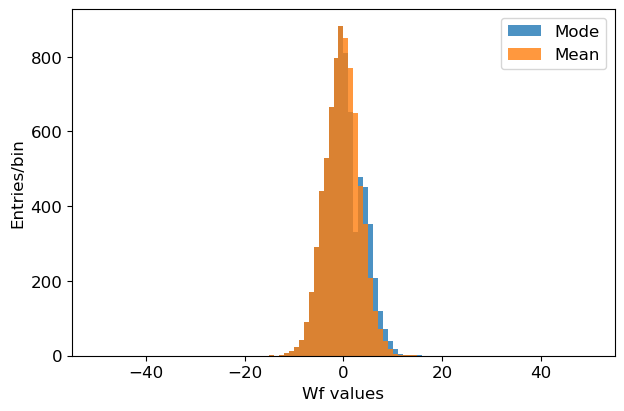

In [15]:
plt.figure(figsize=(7, 4.5))
plt.hist(subt_raw_wfs_mode_pmt[0], bins=100, range=(-50, 50), alpha=0.8, label='Mode')
plt.hist(subt_raw_wfs_mean_pmt[0], bins=100, range=(-50, 50), alpha=0.8, label='Mean')
plt.xlabel('Wf values')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()


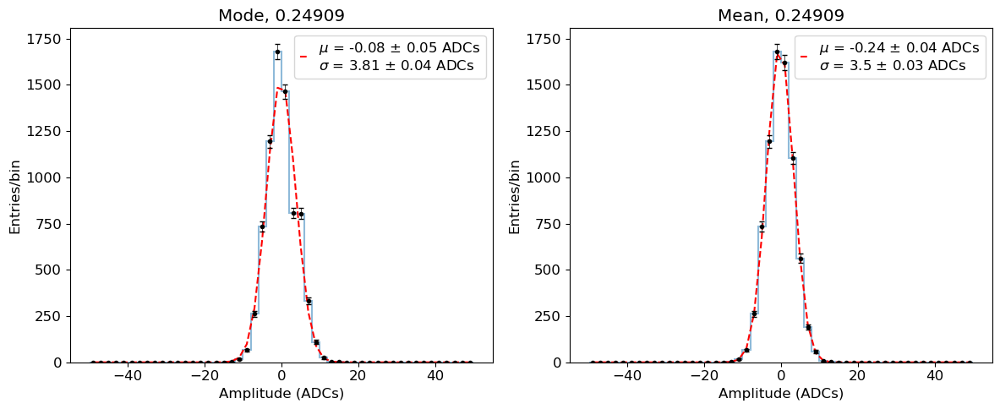

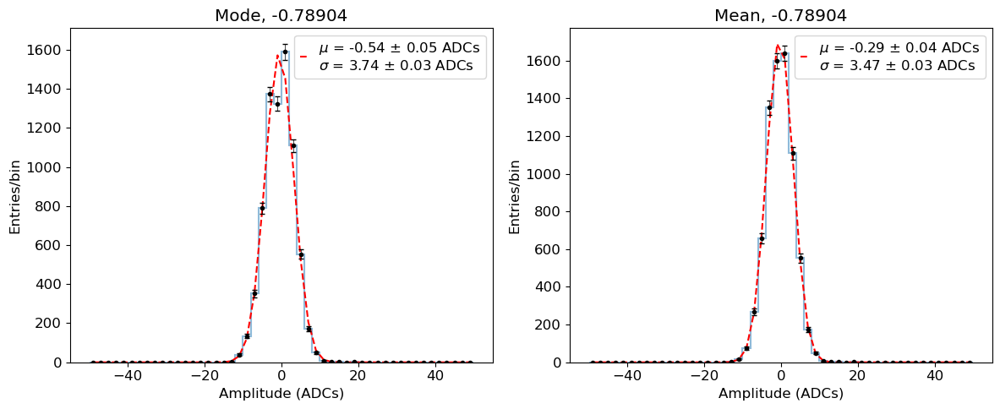

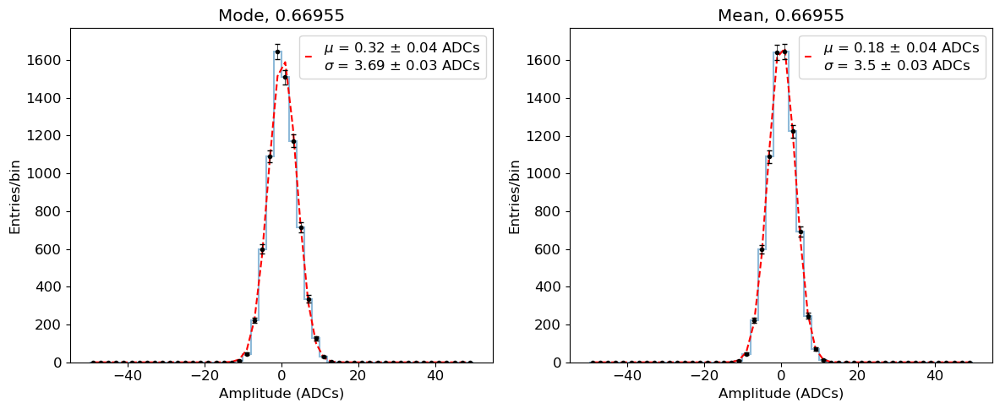

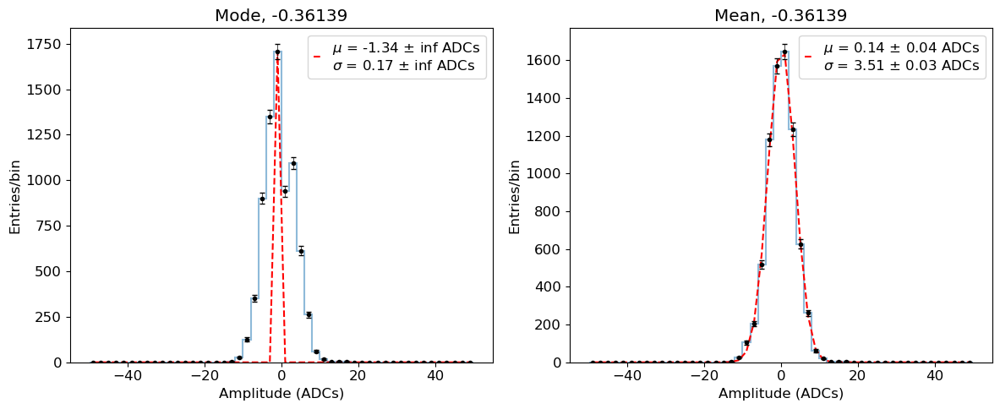

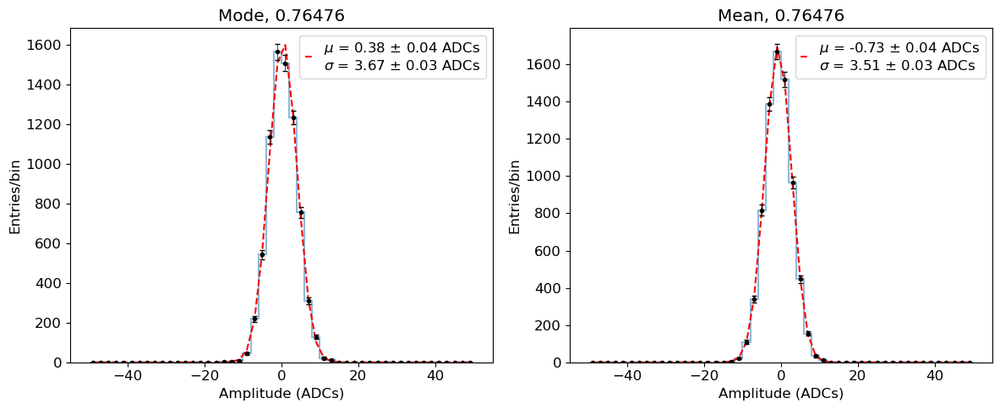

...

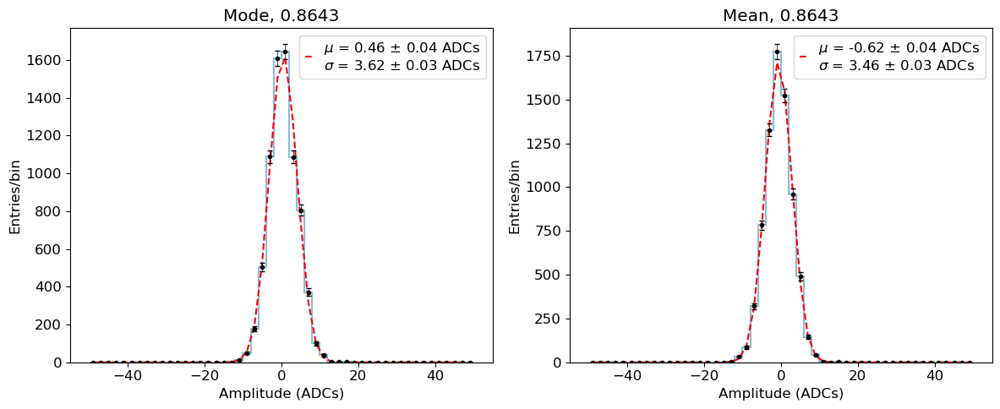

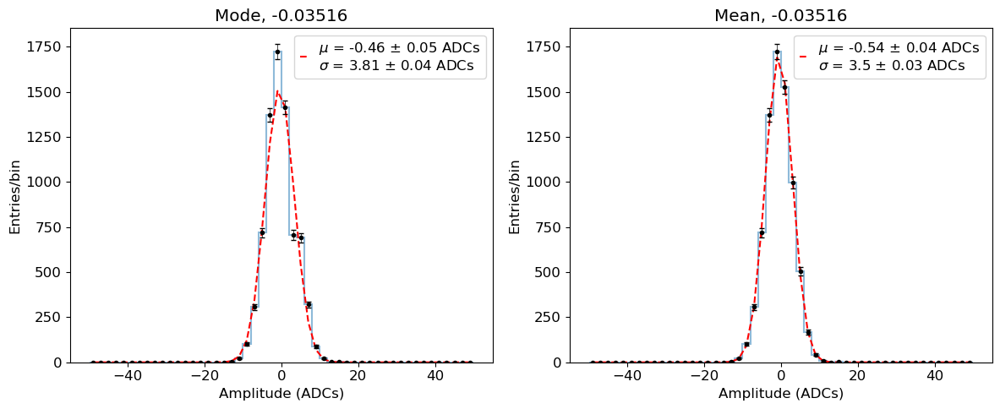

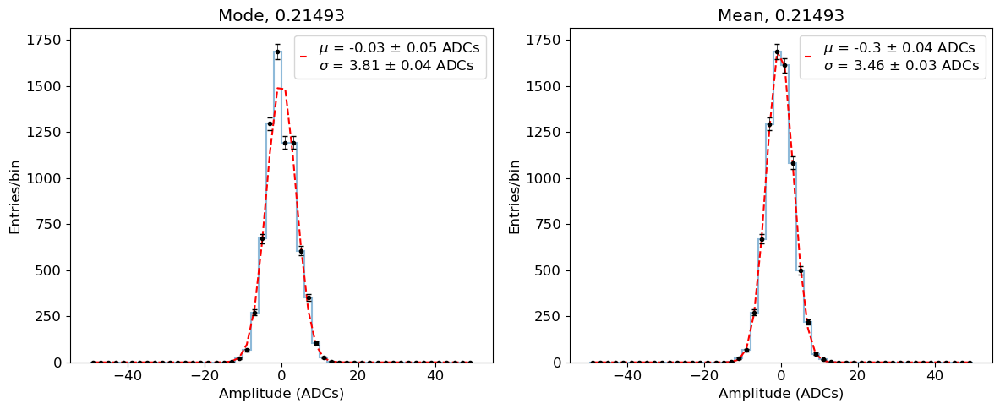

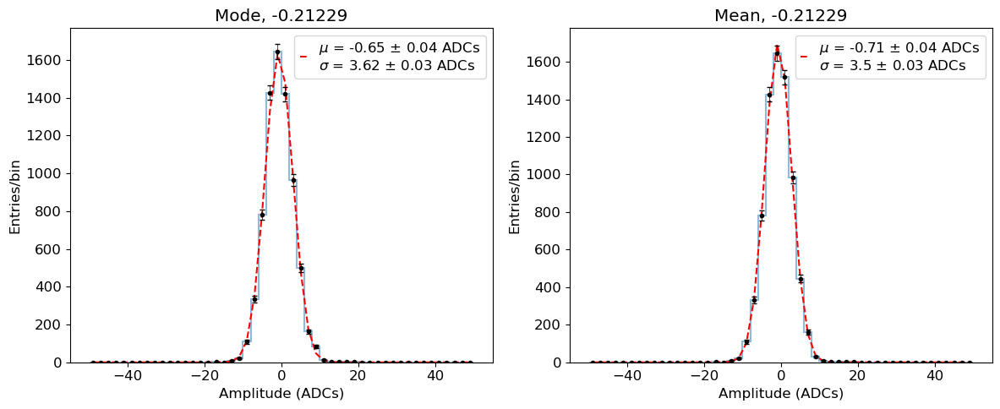

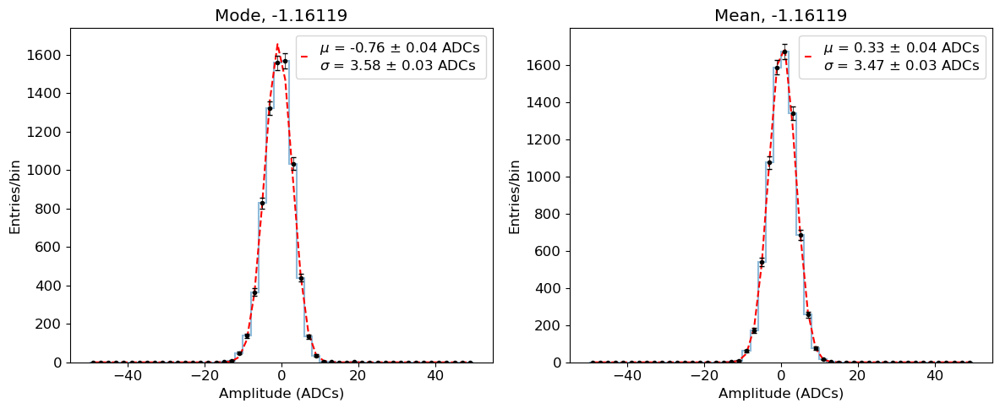

In [17]:
num_evts = 100

mu_mean     = []
mu_mode     = []
mu_mean_err = []
mu_mode_err = []
for iwf, (swf1, swf2) in enumerate(zip(subt_raw_wfs_mode_pmt[:num_evts], subt_raw_wfs_mean_pmt[:num_evts])):    
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
    
    try:
        vals1 = fitf.gaussian_fit_IC_subplot(ax0, swf1[swf1<20], bins=50, prange=(-50, 50), ampl=1000, mean=0, sigma=5, frange=(-10, 10), title=f'Mode, {np.round(np.mean(swf1[swf1<20]), decimals=5)}', print_chi2=False)
        vals2 = fitf.gaussian_fit_IC_subplot(ax1, swf2[swf2<20], bins=50, prange=(-50, 50), ampl=1000, mean=0, sigma=5, frange=(-10, 10), title=f'Mean, {np.round(np.mean(swf1[swf1<20]), decimals=5)}', print_chi2=False)
        plt.tight_layout()
        plt.show()
        mu_mean    .append(vals1[0])
        mu_mode    .append(vals2[0])
        mu_mean_err.append(vals1[1])
        mu_mode_err.append(vals2[1])
    except ValueError:
        continue
        
mu_mean     = np.array(mu_mean    )
mu_mode     = np.array(mu_mode    )
mu_mean_err = np.array(mu_mean_err)
mu_mode_err = np.array(mu_mode_err)

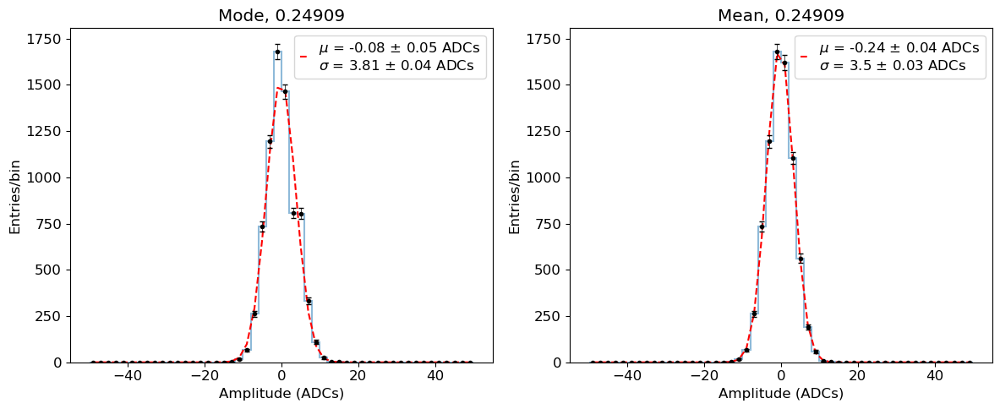

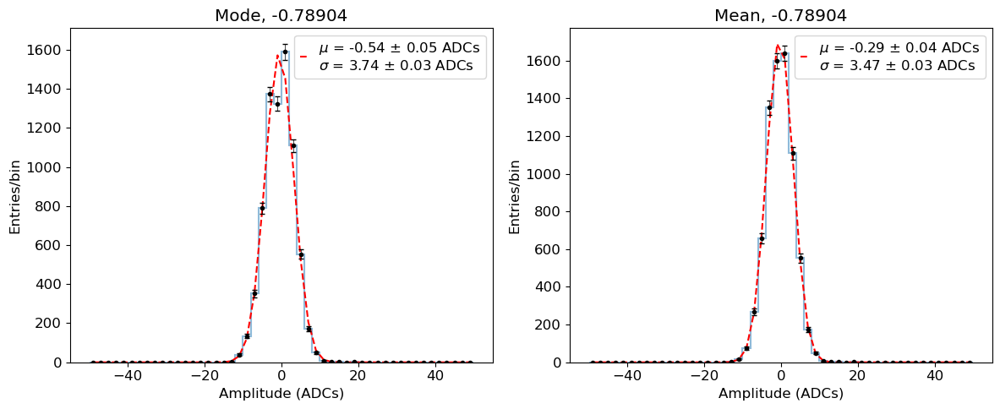

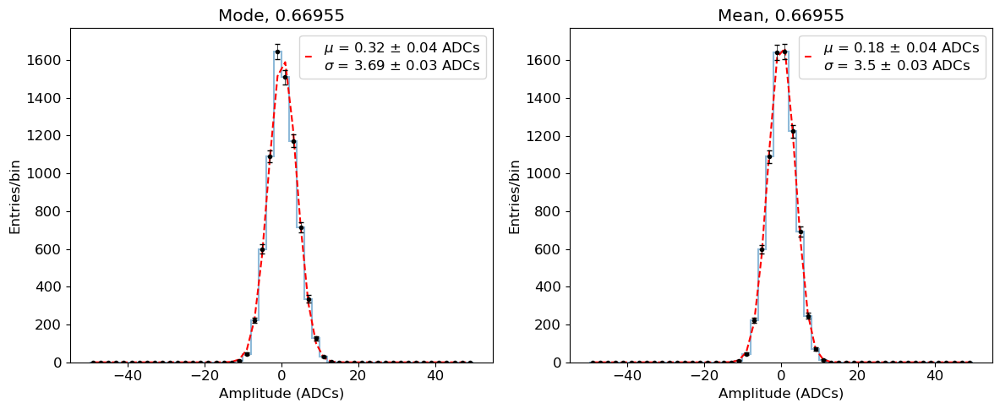

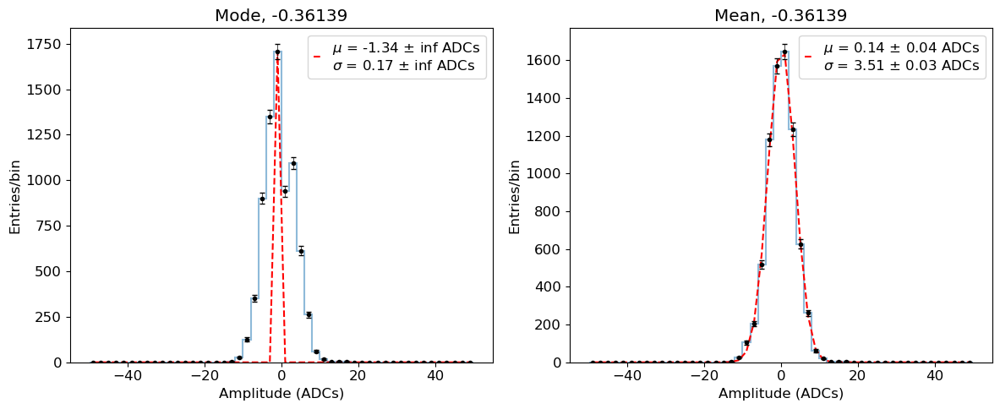

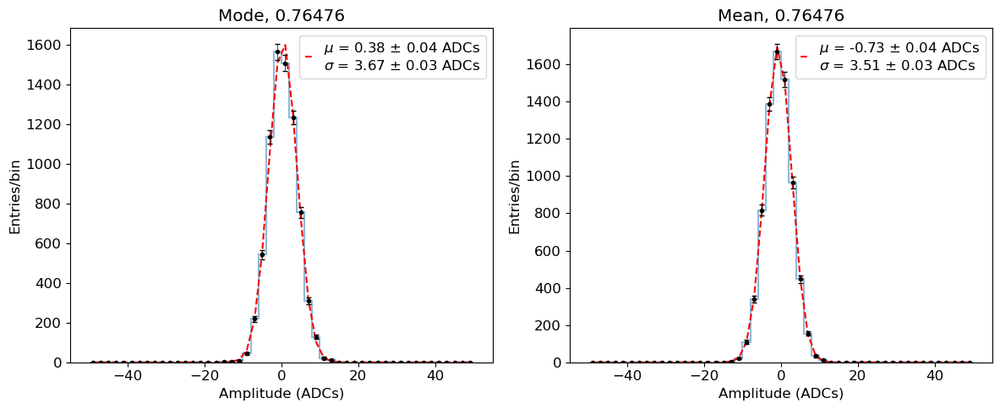

...

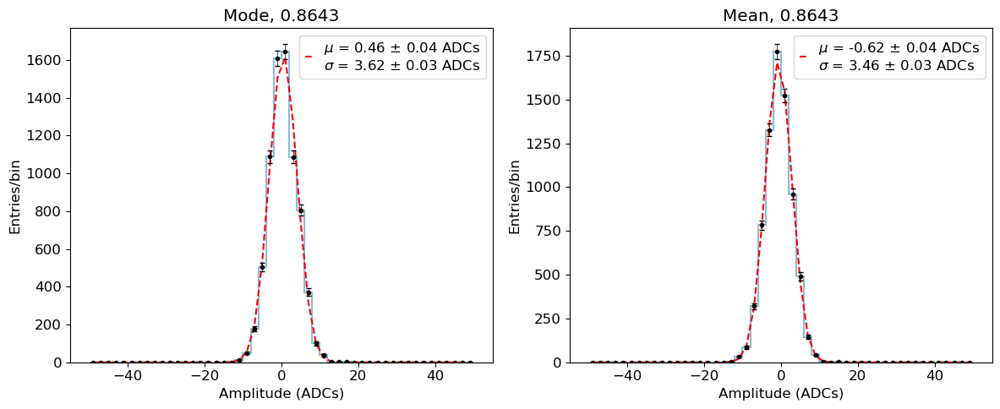

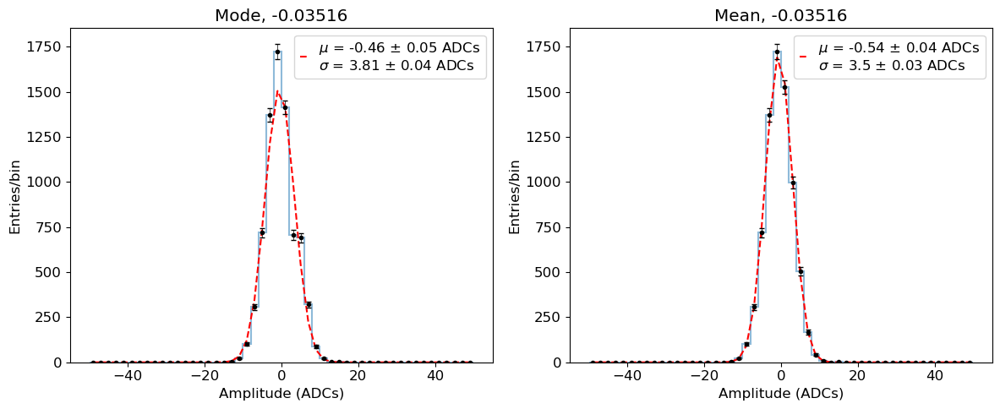

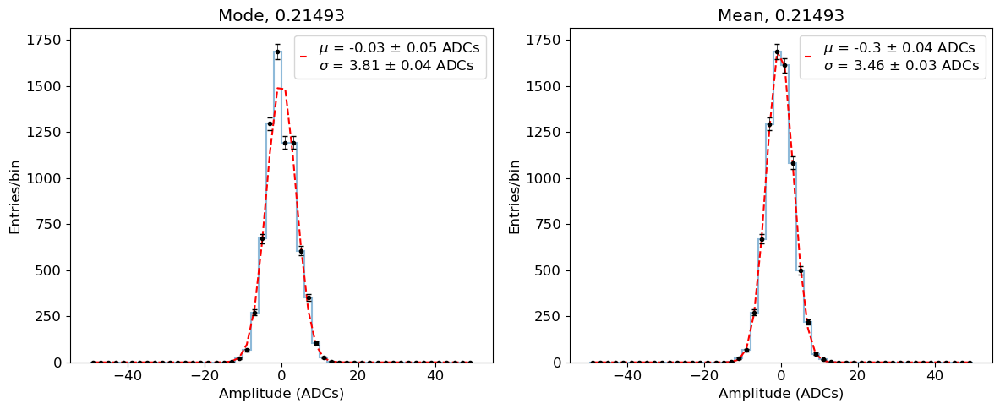

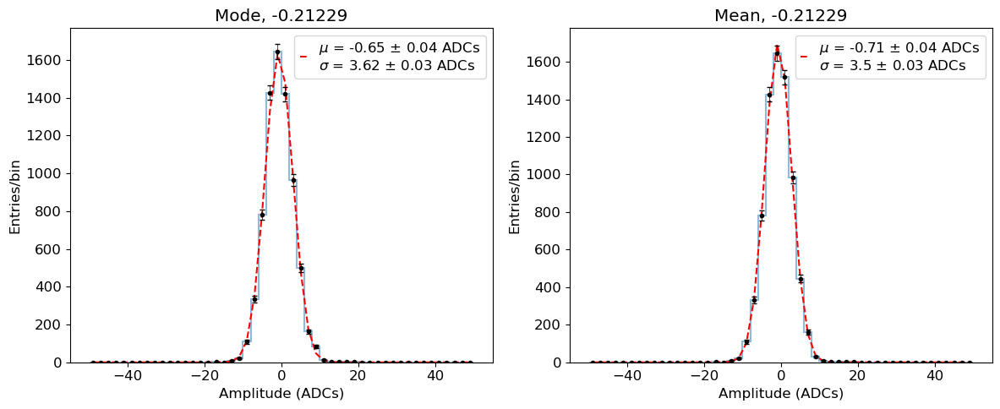

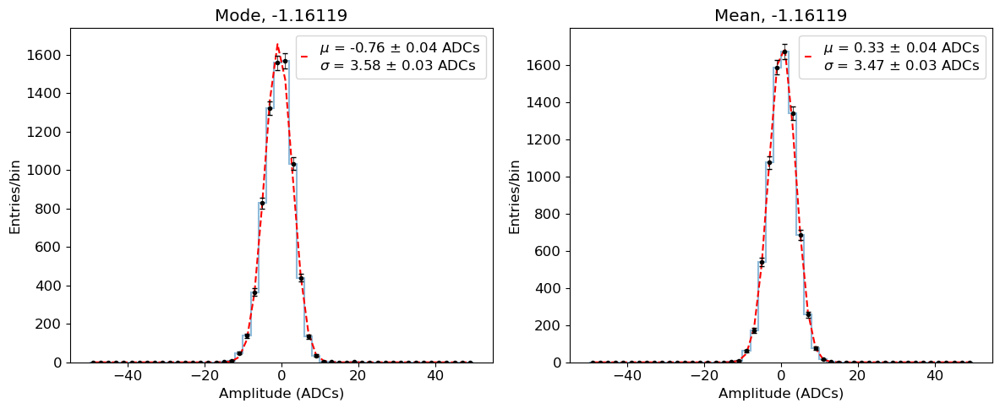

In [19]:
num_evts = 100

mu_mean     = []
mu_mode     = []
mu_mean_err = []
mu_mode_err = []
for iwf, (swf1, swf2) in enumerate(zip(subt_raw_wfs_mode_pmt[:num_evts], subt_raw_wfs_mean_pmt[:num_evts])):    
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
    
    try:
        vals1 = fitf.gaussian_fit_IC_subplot(ax0, swf1[swf1<20], bins=50, prange=(-50, 50), ampl=1000, mean=0, sigma=5, frange=(-10, 10), title=f'Mode, {np.round(np.mean(swf1[swf1<20]), decimals=5)}', print_chi2=False)
        vals2 = fitf.gaussian_fit_IC_subplot(ax1, swf2[swf2<20], bins=50, prange=(-50, 50), ampl=1000, mean=0, sigma=5, frange=(-10, 10), title=f'Mean, {np.round(np.mean(swf1[swf1<20]), decimals=5)}', print_chi2=False)
        plt.tight_layout()
        plt.show()
        mu_mean    .append(vals1[0])
        mu_mode    .append(vals2[0])
        mu_mean_err.append(vals1[1])
        mu_mode_err.append(vals2[1])
    except ValueError:
        continue
        
mu_mean     = np.array(mu_mean    )
mu_mode     = np.array(mu_mode    )
mu_mean_err = np.array(mu_mean_err)
mu_mode_err = np.array(mu_mode_err)

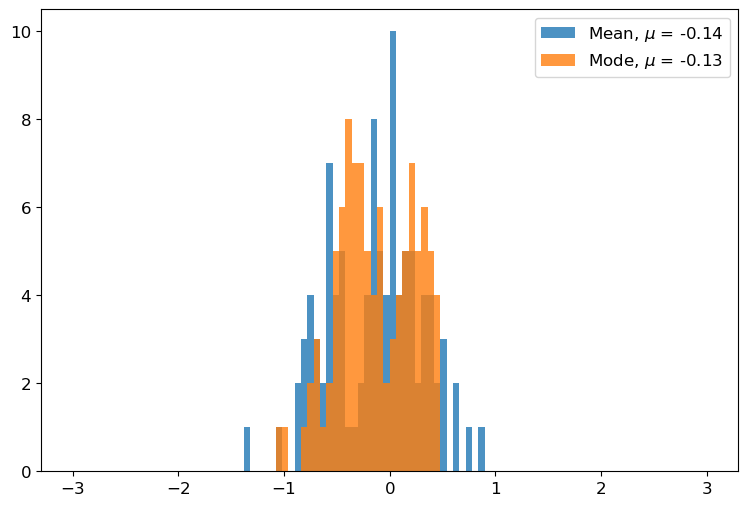

In [20]:
plt.hist(mu_mean, bins=100, range=(-3, 3), alpha=0.8, label=f'Mean, $\mu$ = {np.round(np.mean(mu_mean), decimals=2)}')
plt.hist(mu_mode, bins=100, range=(-3, 3), alpha=0.8, label=f'Mode, $\mu$ = {np.round(np.mean(mu_mode), decimals=2)}')
plt.legend();

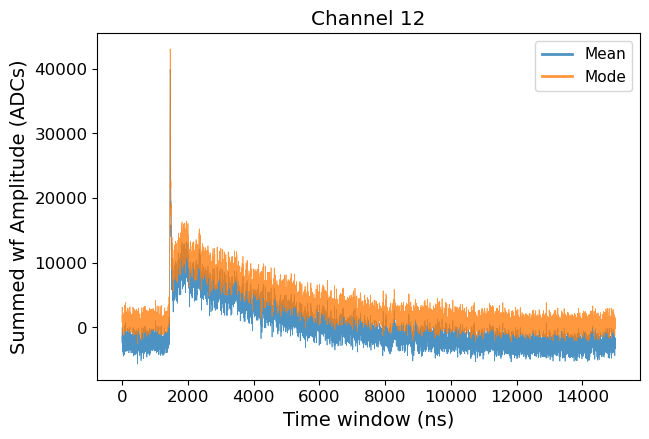

In [23]:
channel  = 12

filt_cwfs_mean = np.sum([sel_wf for sel_wf in subt_raw_wfs_mean_pmt if not (np.any(sel_wf > 1000) or (np.any(sel_wf < -1000)))], axis=0)
filt_cwfs_mode = np.sum([sel_wf for sel_wf in subt_raw_wfs_mode_pmt if not (np.any(sel_wf > 1000) or (np.any(sel_wf < -1000)))], axis=0)

plt.figure(figsize=(7, 4.5))
plt.plot(2*np.arange(len(subt_raw_wfs_mean_pmt[0])), filt_cwfs_mean, linewidth=0.5, alpha=0.8, label='Mean')
plt.plot(2*np.arange(len(subt_raw_wfs_mode_pmt[0])), filt_cwfs_mode, linewidth=0.5, alpha=0.8, label='Mode')
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Summed wf Amplitude (ADCs)', fontsize=14)
plt.title(f"Channel {channel}")
leg = plt.legend(fontsize=11)
for line in leg.get_lines():
    line.set_linewidth(2)
plt.show()

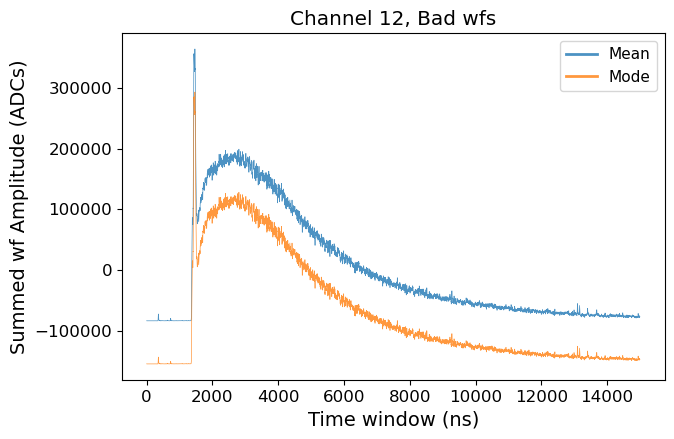

In [24]:
channel  = 12

filt_cwfs_mean = np.sum([sel_wf for sel_wf in subt_raw_wfs_mean_pmt if (np.any(sel_wf > 1000) or (np.any(sel_wf < -1000)))], axis=0)
filt_cwfs_mode = np.sum([sel_wf for sel_wf in subt_raw_wfs_mode_pmt if (np.any(sel_wf > 1000) or (np.any(sel_wf < -1000)))], axis=0)

plt.figure(figsize=(7, 4.5))
plt.plot(2*np.arange(len(subt_raw_wfs_mean_pmt[0])), filt_cwfs_mean, linewidth=0.5, alpha=0.8, label='Mean')
plt.plot(2*np.arange(len(subt_raw_wfs_mode_pmt[0])), filt_cwfs_mode, linewidth=0.5, alpha=0.8, label='Mode')
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Summed wf Amplitude (ADCs)', fontsize=14)
plt.title(f"Channel {channel}, Bad wfs")
leg = plt.legend(fontsize=11)
for line in leg.get_lines():
    line.set_linewidth(2)
plt.show()

## Baseline analysis for all channels:

In [25]:
evts_path = '/Users/romoluque_c/LEGEND/BACON/data_npz/'

mean_baselines_dict = {}
dates_datetime_f    = {}
all_channels        = np.array([0, 1, 2, 4, 5, 6, 7, 8, 12])

pos_date1 = 20
pos_date2 = 30

def get_date(filename):
    date_str = filename[pos_date1:pos_date2]
    date = datetime.strptime(date_str, '%m_%d_%Y')
    return date

files        = os.listdir(evts_path)
filt_files   = [file for file in files if file.startswith("BACoN_baseline")]
sorted_files = sorted(filt_files, key=get_date)

for filename in sorted_files:
    my_file = evts_path+filename
    d = np.load(my_file, allow_pickle=True)
    
    date = filename[pos_date1:pos_date2]
    
    if date not in mean_baselines_dict:
        mean_baselines = [np.array([]) for _ in range(len(all_channels))]

    for i,channel in enumerate(all_channels):
        mean_baselines[i] = np.append(mean_baselines[i], d['mean_baselines'][i])
        
    mean_baselines_dict[date] = np.array(mean_baselines, dtype=object)
    dates_datetime_f   [date] = get_date(filename)

In [26]:
mean_baselines_dict;

In [27]:
dates_datetime_f;

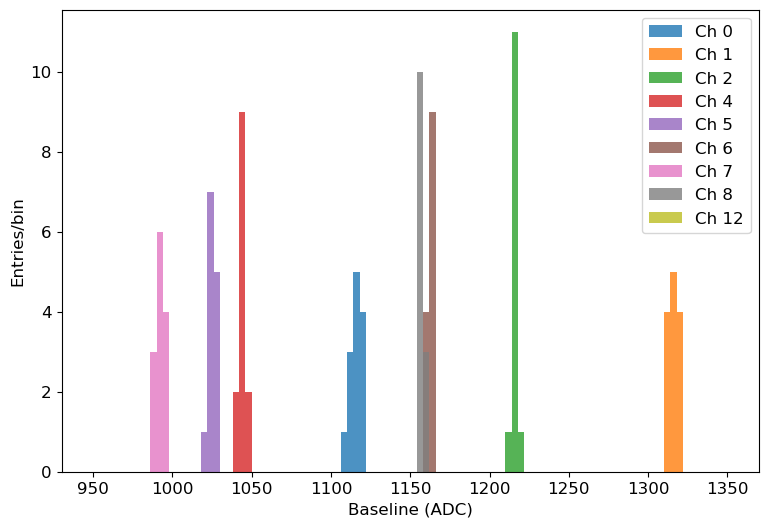

In [28]:
for ch, bsl in zip(all_channels, mean_baselines_dict['05_08_2023']):
    plt.hist(bsl, bins=100, range=(950, 1350), label=f'Ch {ch}', alpha=0.8)
    plt.xlabel('Baseline (ADC)')
    plt.ylabel('Entries/bin')
    plt.legend()

Text(0, 0.5, 'Entries/bin')

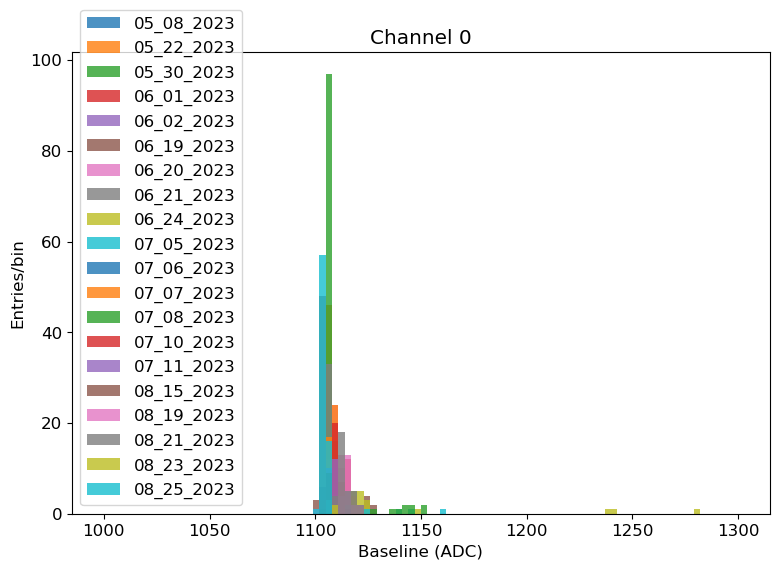

In [29]:
channel = 0
for key in mean_baselines_dict.keys():
    plt.hist(mean_baselines_dict[key][0], bins=100, range=(1000, 1300), label=f'{key}', alpha=0.8)
plt.legend()
plt.title(f'Channel {channel}')
plt.xlabel('Baseline (ADC)')
plt.ylabel('Entries/bin')

Text(0, 0.5, 'Entries/bin')

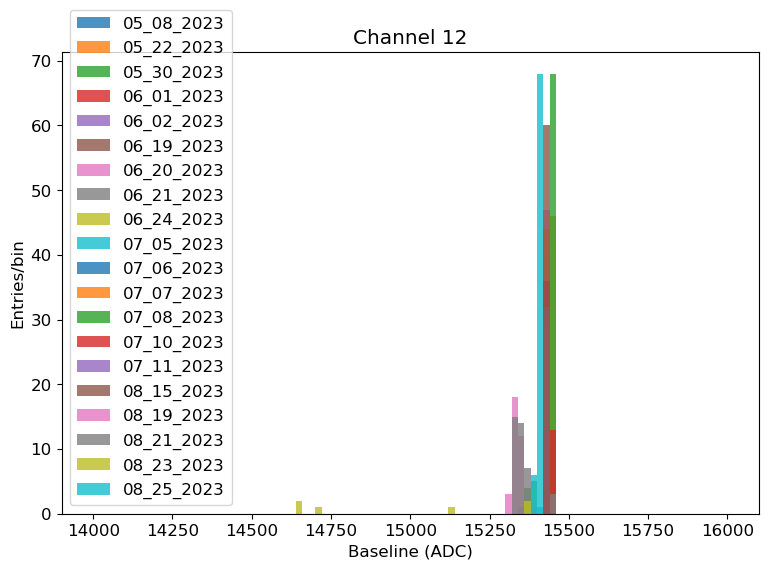

In [30]:
channel = 12
for key in mean_baselines_dict.keys():
    plt.hist(mean_baselines_dict[key][8], bins=100, range=(14000, 16000), label=f'{key}', alpha=0.8)
plt.legend()
plt.title(f'Channel {channel}')
plt.xlabel('Baseline (ADC)')
plt.ylabel('Entries/bin')

Text(0, 0.5, 'Baseline (ADCs)')

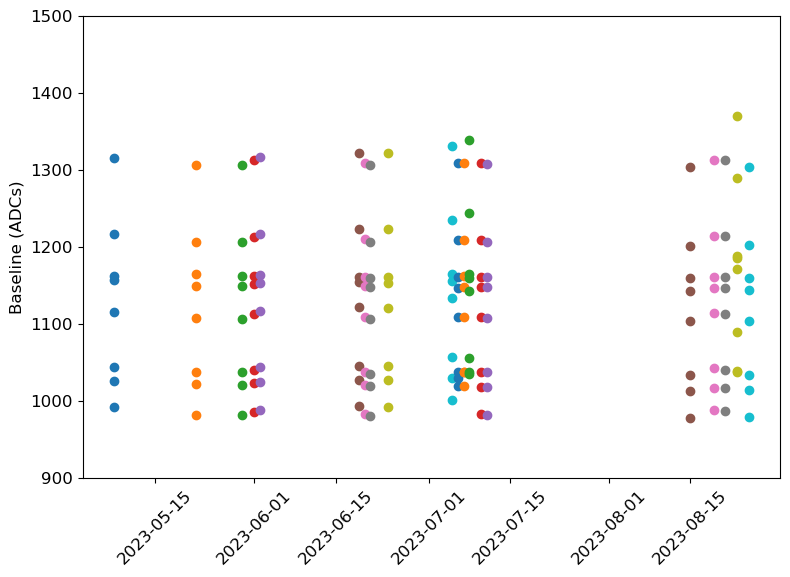

In [31]:
for key, vals in mean_baselines_dict.items():
    plt.scatter(np.full(9, dates_datetime_f[key]), np.mean(vals, axis=1))
plt.xticks(rotation=45)
plt.ylim(900, 1500)
plt.ylabel('Baseline (ADCs)')

[Text(19478.0, 0, '2023-05-01'),
 Text(19492.0, 0, '2023-05-15'),
 Text(19509.0, 0, '2023-06-01'),
 Text(19523.0, 0, '2023-06-15'),
 Text(19539.0, 0, '2023-07-01'),
 Text(19553.0, 0, '2023-07-15'),
 Text(19570.0, 0, '2023-08-01'),
 Text(19584.0, 0, '2023-08-15'),
 Text(19601.0, 0, '2023-09-01')]

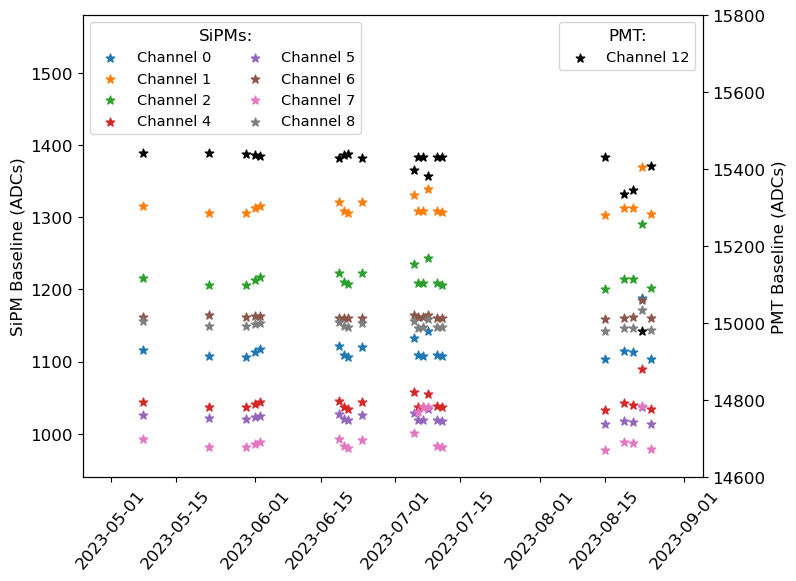

In [32]:
mean_bsl_transp = np.array([np.mean(vals, axis=1) for vals in mean_baselines_dict.values()]).T
#all_dates       = np.array(list(mean_baselines_dict.keys()))
all_dates       = np.array([dates_datetime_f[key] for key in mean_baselines_dict.keys()])

fig, ax0 = plt.subplots(1, 1, figsize=(8,6))
ax1 = ax0.twinx()
for ch, mbsl in zip(all_channels, mean_bsl_transp):
    if ch < 12:
        ax0.scatter(all_dates, mbsl, marker='*', s=40, label=f'Channel {ch}')
    else:
        ax1.scatter(all_dates, mbsl, marker='*', s=40, label=f'Channel {ch}', color='k')
ax0.set_xlim(pd.to_datetime('2023-04-25'), pd.to_datetime('2023-09-5'))
ax0.set_ylim(940, 1580)
ax1.set_ylim(14600, 15800)
ax0.set_ylabel('SiPM Baseline (ADCs)')
ax1.set_ylabel('PMT Baseline (ADCs)')
ax0.legend(title='SiPMs:', fontsize=10.5, loc=2, ncol=2)
ax1.legend(title='PMT:',   fontsize=10.5, loc=0)
ax0.set_xticklabels(ax0.get_xticklabels(), rotation=50)